In [1]:
#imports
from os.path import abspath,join,dirname,normpath,basename
from os import makedirs,rename,rmdir
import requests,zipfile,io
import shutil
import seaborn as sns
import csv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zipfile
import math
import pandas as pd
import matplotlib.pyplot as plt
from pandas.core.dtypes.common import is_int64_dtype

## Objective 1 - What kind of path can we follow to identify the types of tech groups?
For this, we will first look into features that might help us to identify types of tech groups. Afterwards we will look into visualizations we have and try to identify what kind of groups we have.

Since each feature that has been collected for the same goal has different names throughout the years, need to identify them manually

2022: HAS "DEVTYPE", "LANGUAGE", "DATABASE", "PLATFORM", "WEBFRAME", "MISCTECH", "TOOLSTECH", "NEWCOLLABTOOL", "OFFICESTACKASYNC", "OFFICESTACKSYNC"

"DevType", "LanguageHaveWorkedWith", "LanguageWantToWorkWith", "DatabaseHaveWorkedWith", "DatabaseWantToWorkWith", "PlatformHaveWorkedWith", "PlatformWantToWorkWith", "WebframeHaveWorkedWith", "WebframeWantToWorkWith", "MiscTechHaveWorkedWith", "MiscTechWantToWorkWith", "ToolsTechHaveWorkedWith", "ToolsTechWantToWorkWith", "NEWCollabToolsHaveWorkedWith", "NEWCollabToolsWantToWorkWith", "OfficeStackAsyncHaveWorkedWith", "OfficeStackAsyncWantToWorkWith", "OfficeStackSyncHaveWorkedWith", "OfficeStackSyncWantToWorkWith"


2021: HAS "DEVTYPE", "LANGUAGE", "DATABASE", "PLATFORM", "WEBFRAME", "MISCTECH", "TOOLSTECH", "NEWCOLLABTOOL"

"DevType", 'LanguageHaveWorkedWith', 'LanguageWantToWorkWith', 'DatabaseHaveWorkedWith', 'DatabaseWantToWorkWith', 'PlatformHaveWorkedWith', 'PlatformWantToWorkWith', 'WebframeHaveWorkedWith', 'WebframeWantToWorkWith', 'MiscTechHaveWorkedWith', 'MiscTechWantToWorkWith', 'ToolsTechHaveWorkedWith', 'ToolsTechWantToWorkWith', 'NEWCollabToolsHaveWorkedWith', 'NEWCollabToolsWantToWorkWith'


2020: HAS "DEVTYPE", "LANGUAGE", "DATABASE", "PLATFORM", "WEBFRAME", "MISCTECH", "NEWCOLLABTOOL"

'DevType', 'LanguageDesireNextYear', 'LanguageWorkedWith',
       'MiscTechDesireNextYear', 'MiscTechWorkedWith',
       'NEWCollabToolsDesireNextYear', 'NEWCollabToolsWorkedWith', 'PlatformDesireNextYear',
       'PlatformWorkedWith', 'WebframeDesireNextYear',
       'WebframeWorkedWith', 'DatabaseDesireNextYear', 'DatabaseWorkedWith'


2019: HAS "DEVTYPE", "LANGUAGE", "DATABASE", "PLATFORM", "WEBFRAME", "MISCTECH"

'DevType', 'LanguageDesireNextYear', 'LanguageWorkedWith', 'DatabaseWorkedWith',
       'DatabaseDesireNextYear', 'PlatformWorkedWith',
       'PlatformDesireNextYear', 'WebFrameWorkedWith',
       'WebFrameDesireNextYear', 'MiscTechDesireNextYear', 'MiscTechWorkedWith'


2018: HAS "DEVTYPE", "LANGUAGE", "DATABASE", "PLATFORM", "WEBFRAME"

'DevType', 'LanguageDesireNextYear', 'LanguageWorkedWith', 'DatabaseWorkedWith',
       'DatabaseDesireNextYear', 'PlatformWorkedWith',
       'PlatformDesireNextYear', "FrameworkWorkedWith",
"FrameworkDesireNextYear"


2017: HAS "DEVTYPE", "LANGUAGE", "DATABASE", "PLATFORM", "WEBFRAME"

'DeveloperType', HaveWorkedLanguage, WantWorkLanguage,
HaveWorkedFramework, WantWorkFramework, HaveWorkedDatabase, WantWorkDatabase,
HaveWorkedPlatform, WantWorkPlatform

#### Functions

In [2]:
from pandas.core.dtypes.common import is_int64_dtype

# turning each cell in df if given string list, turn to actual list
def turn_df_to_list(given_dataframe):
    grouped_comma_fixed = given_dataframe.copy()

    # first turning "," inside each cell to "TO" such that afterwards when we turn it into a list it won't confuse us
    for col_name in given_dataframe.columns:
        if not is_int64_dtype(given_dataframe.dtypes[col_name]):
            grouped_comma_fixed[col_name] = given_dataframe[col_name].str.replace(', ','TO')

    # then turning each ";" separated value inside the cell into a list such that we can use explode
    grouped_to_list = grouped_comma_fixed.copy()

    for col_name in given_dataframe.columns:
        if not is_int64_dtype(grouped_to_list.dtypes[col_name]):
            grouped_to_list[col_name] = grouped_comma_fixed[col_name].str.split(';')

    return grouped_to_list

# some smart visualization to see colours and labels at the same time :))
def plot_bar_with_labels(number_of_bins, data, column_name = "", extra_comment = ""):

    n = number_of_bins # number of bins

    if number_of_bins > len(data.index): # if number of unique responses below n, then just set it equal
        n = len(data.index)

    fig = plt.subplots(figsize = (12,7)) # for size

    counts = data.values[0:n].tolist()
    labels = data.index[0:n]
    xs = np.arange(n)
    plt.xticks(xs, xs) # creating names on the x-axis

    total_count = 0

    for count in counts: # so I can display colours according to range
        total_count += count

    labels_as_string = []
    for i in range(len(labels)): # adding the label indexes
        labels_as_string.append(str(i) + ": " + str(labels[i]))

    for i, x in enumerate(xs):
        plt.bar(i, counts[x], color=(0, 0, counts[x] / total_count, 0.9))

    plt.title("Top " + str(n) + " occurrences of " + column_name + ": " + extra_comment)
    plt.xlabel('indexes')
    plt.ylabel('nr. of occurrences')
    plt.legend(labels_as_string)
    # plt.legend(labels, bbox_to_anchor=(1.05, 1), loc='upper left')

# columns names will be changed from given_dataset_2, to given_dataset_1. This function also assumed that the order of the column names (even though different names) are in the same order
def change_column_names_in_index(columns_1, given_dataset_2, columns_2):
    given_dataset_2 = given_dataset_2.copy() # copying first so I can use "inplace"

    for i in range(len(columns_2)):
        given_dataset_2.rename(columns={columns_2[i]: columns_1[i]}, inplace=True)

    return given_dataset_2

#### Combining and Modifying for EDA
The process followed in the cell below is completely manual. Because since the column names and the existing columns are different, need to perform each function with data-specific column names.

In [3]:
# taking common path
data_folder=join(dirname(abspath('')),'data')

# Years 2022-2017
temp22 = pd.read_csv(join(data_folder, 'survey_results_public2022.csv'))
temp21 = pd.read_csv(join(data_folder, 'survey_results_public2021.csv'))
temp20 = pd.read_csv(join(data_folder, 'survey_results_public2020.csv'))
temp19 = pd.read_csv(join(data_folder, 'survey_results_public2019.csv'))
temp18 = pd.read_csv(join(data_folder, 'survey_results_public2018.csv'))
temp17 = pd.read_csv(join(data_folder, 'survey_results_public2017.csv'))

# In the code below I try to make sure that I save the manually selected tech columns of each year and also that it's in the same order with the others (so that I can easily convert the column names later) and the sooner a column is removed the more behind to be (this will make sense soon).

# 2022: HAS “DEVTYPE”, “LANGUAGE”, “DATABASE”, “PLATFORM”, “WEBFRAME”, “MISCTECH”, “NEWCOLLABTOOL”, “TOOLSTECH”, “OFFICESTACKASYNC”, “OFFICESTACKSYNC”
tech_columns_of_22 = ["DevType", "LanguageHaveWorkedWith", "LanguageWantToWorkWith", "DatabaseHaveWorkedWith", "DatabaseWantToWorkWith", "PlatformHaveWorkedWith", "PlatformWantToWorkWith", "WebframeHaveWorkedWith", "WebframeWantToWorkWith", "MiscTechHaveWorkedWith", "MiscTechWantToWorkWith",  "NEWCollabToolsHaveWorkedWith", "NEWCollabToolsWantToWorkWith", "ToolsTechHaveWorkedWith", "ToolsTechWantToWorkWith","OfficeStackAsyncHaveWorkedWith", "OfficeStackAsyncWantToWorkWith", "OfficeStackSyncHaveWorkedWith", "OfficeStackSyncWantToWorkWith"]
temp22_grouped = temp22.groupby(tech_columns_of_22).size().reset_index().rename(columns={0:'count'})


# 2021: HAS "DEVTYPE", "LANGUAGE", "DATABASE", "PLATFORM", "WEBFRAME", "MISCTECH", "NEWCOLLABTOOL", "TOOLSTECH"
tech_columns_of_21 = ["DevType", 'LanguageHaveWorkedWith', 'LanguageWantToWorkWith', 'DatabaseHaveWorkedWith', 'DatabaseWantToWorkWith', 'PlatformHaveWorkedWith', 'PlatformWantToWorkWith', 'WebframeHaveWorkedWith', 'WebframeWantToWorkWith', 'MiscTechHaveWorkedWith', 'MiscTechWantToWorkWith',  'NEWCollabToolsHaveWorkedWith', 'NEWCollabToolsWantToWorkWith', 'ToolsTechHaveWorkedWith', 'ToolsTechWantToWorkWith']
temp21_grouped = temp21.groupby(tech_columns_of_21).size().reset_index().rename(columns={0:'count'})


# 2020: HAS "DEVTYPE", "LANGUAGE", "DATABASE", "PLATFORM", "WEBFRAME", "MISCTECH", "NEWCOLLABTOOL"
tech_columns_of_20 = ['DevType', 'LanguageWorkedWith', 'LanguageDesireNextYear', 'DatabaseWorkedWith', 'DatabaseDesireNextYear', 'PlatformWorkedWith', 'PlatformDesireNextYear', 'WebframeWorkedWith',
    'WebframeDesireNextYear', 'MiscTechWorkedWith', 'MiscTechDesireNextYear', 'NEWCollabToolsWorkedWith', 'NEWCollabToolsDesireNextYear']
temp20_grouped = temp20.groupby(tech_columns_of_20).size().reset_index().rename(columns={0:'count'})


# 2019: HAS "DEVTYPE", "LANGUAGE", "DATABASE", "PLATFORM", "WEBFRAME", "MISCTECH"
tech_columns_of_19 = ['DevType', 'LanguageWorkedWith','LanguageDesireNextYear',  'DatabaseWorkedWith',
       'DatabaseDesireNextYear', 'PlatformWorkedWith',
       'PlatformDesireNextYear', 'WebFrameWorkedWith',
       'WebFrameDesireNextYear', 'MiscTechWorkedWith', 'MiscTechDesireNextYear']
temp19_grouped = temp19.groupby(tech_columns_of_19).size().reset_index().rename(columns={0:'count'})


# 2018: HAS "DEVTYPE", "LANGUAGE", "DATABASE", "PLATFORM", "WEBFRAME"
tech_columns_of_18 = ['DevType', 'LanguageWorkedWith', 'LanguageDesireNextYear', 'DatabaseWorkedWith',
       'DatabaseDesireNextYear', 'PlatformWorkedWith',
       'PlatformDesireNextYear', "FrameworkWorkedWith", "FrameworkDesireNextYear"]
temp18_grouped = temp18.groupby(tech_columns_of_18).size().reset_index().rename(columns={0:'count'})


# 2017: HAS "DEVTYPE", "LANGUAGE", "DATABASE", "PLATFORM", "WEBFRAME"
tech_columns_of_17 = ['DeveloperType', "HaveWorkedLanguage", "WantWorkLanguage",
 "HaveWorkedDatabase", "WantWorkDatabase", "HaveWorkedPlatform", "WantWorkPlatform", "HaveWorkedFramework", "WantWorkFramework"]
temp17_grouped = temp17.groupby(tech_columns_of_17).size().reset_index().rename(columns={0:'count'})

C:\Users\dnaen\AppData\Local\Temp\ipykernel_21396\1256186794.py:9: DtypeWarning: Columns (8,12,13,14,15,16,50,51,52,53,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128) have mixed types. Specify dtype option on import or set low_memory=False.
  temp18 = pd.read_csv(join(data_folder, 'survey_results_public2018.csv'))


In [4]:
# now time to rename the columns names into original ("2022") column name
temp21_grouped_changed_column_name = change_column_names_in_index(tech_columns_of_22, temp21_grouped, tech_columns_of_21)
temp20_grouped_changed_column_name = change_column_names_in_index(tech_columns_of_22, temp20_grouped, tech_columns_of_20)
temp19_grouped_changed_column_name = change_column_names_in_index(tech_columns_of_22, temp19_grouped, tech_columns_of_19)
temp18_grouped_changed_column_name = change_column_names_in_index(tech_columns_of_22, temp18_grouped, tech_columns_of_18)
temp17_grouped_changed_column_name = change_column_names_in_index(tech_columns_of_22, temp17_grouped, tech_columns_of_17)

In [5]:
# finally, let's turn our not so list data (e.g., "A;B;c;s") inside the dataframe cells to actual list (e.g., [A,B,c,s])
temp22_grouped_list = turn_df_to_list(temp22_grouped)
temp21_grouped_list = turn_df_to_list(temp21_grouped_changed_column_name)
temp20_grouped_list = turn_df_to_list(temp20_grouped_changed_column_name)
temp19_grouped_list = turn_df_to_list(temp19_grouped_changed_column_name)
temp18_grouped_list = turn_df_to_list(temp18_grouped_changed_column_name)
temp17_grouped_list = turn_df_to_list(temp17_grouped_changed_column_name)

#### EDA
Now we have our brand new dataframes that are ready to be visualized :))

In [6]:
years_list = [temp17_grouped_list, temp18_grouped_list, temp19_grouped_list, temp20_grouped_list, temp21_grouped_list, temp22_grouped_list]
years_string = ["2017", "2018", "2019", "2020", "2021", "2022"]

As we have mentioned previously some cells inside the df were given as just a string for multiple answers to a single question, e.g., "A;B;c;s". But have turned these responses into a list, this allows us to perform two kinds of visualization. One for "combined" visualizations where the lists are counted as a single response, and one for "individual" where each element of any list answer inside a cell of df are counted individually.

ex:
Combined - [A,B,c,s] -> count 1: [A,B,c,s]
Individual - [A,B,c,s] -> count 1: A, count 1: B, count 1: c, count 1: s

#### NOTE: There is another cell after these tooo many visualizations which the cell is for visualizing the responses as individual (with the use of explode)

C:\Users\dnaen\AppData\Local\Temp\ipykernel_21396\2875292497.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.subplots(figsize = (12,7)) # for size


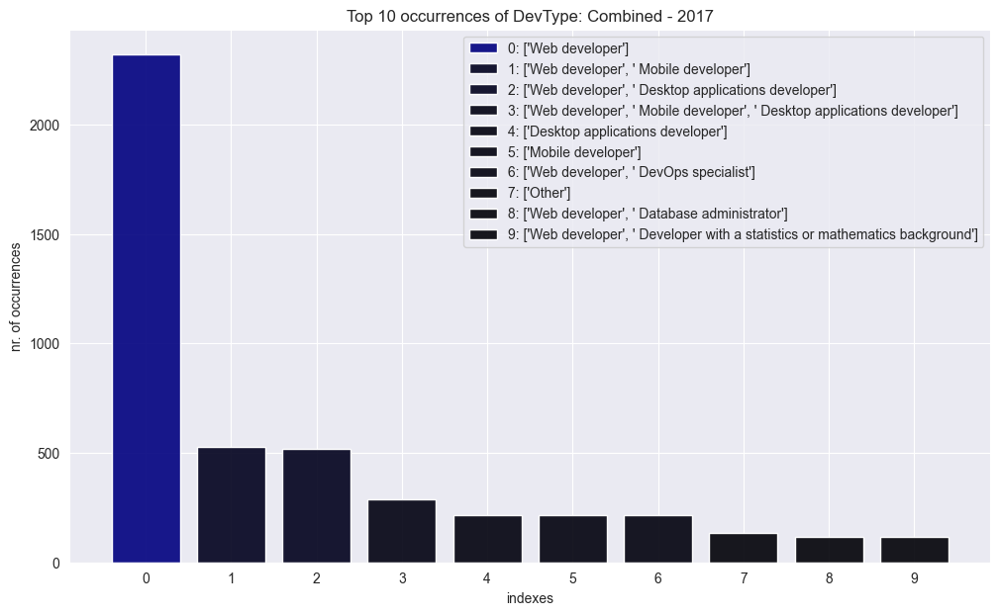

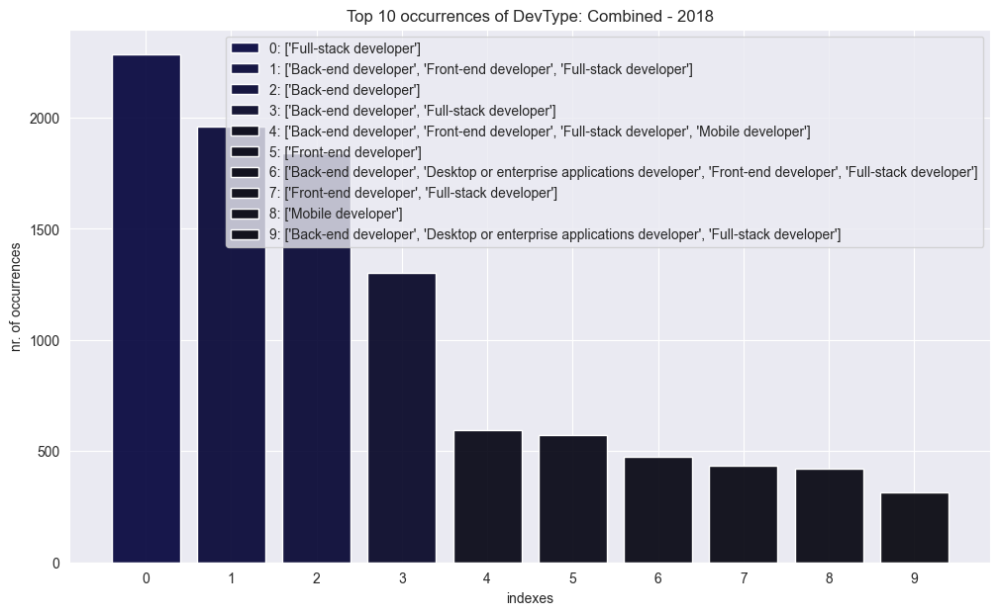

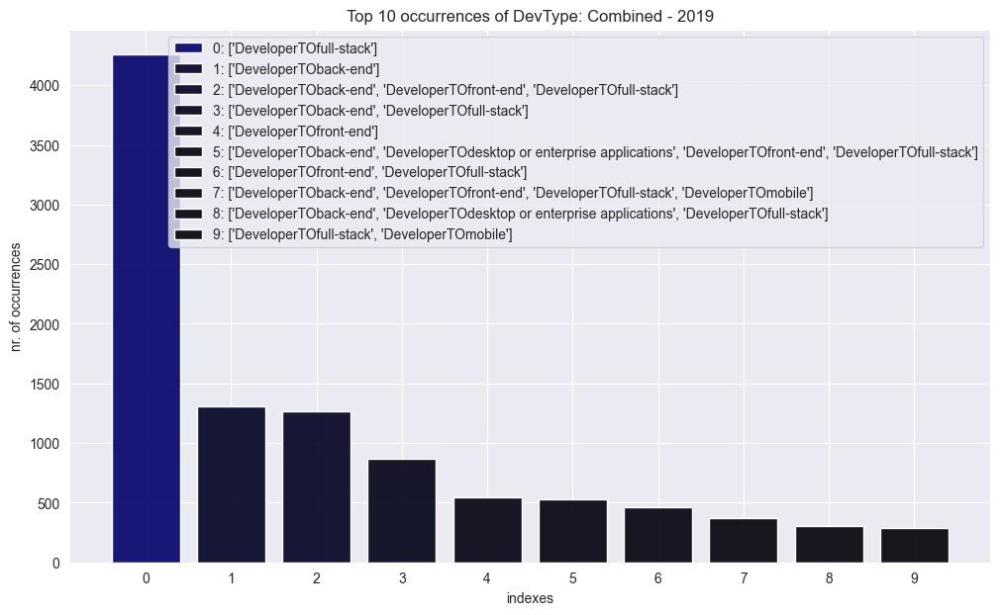

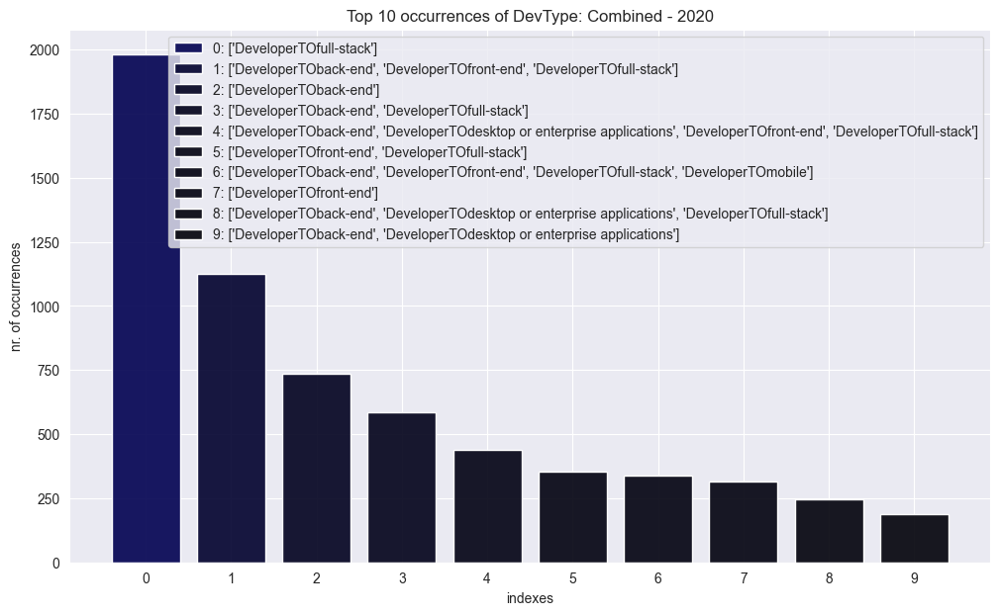

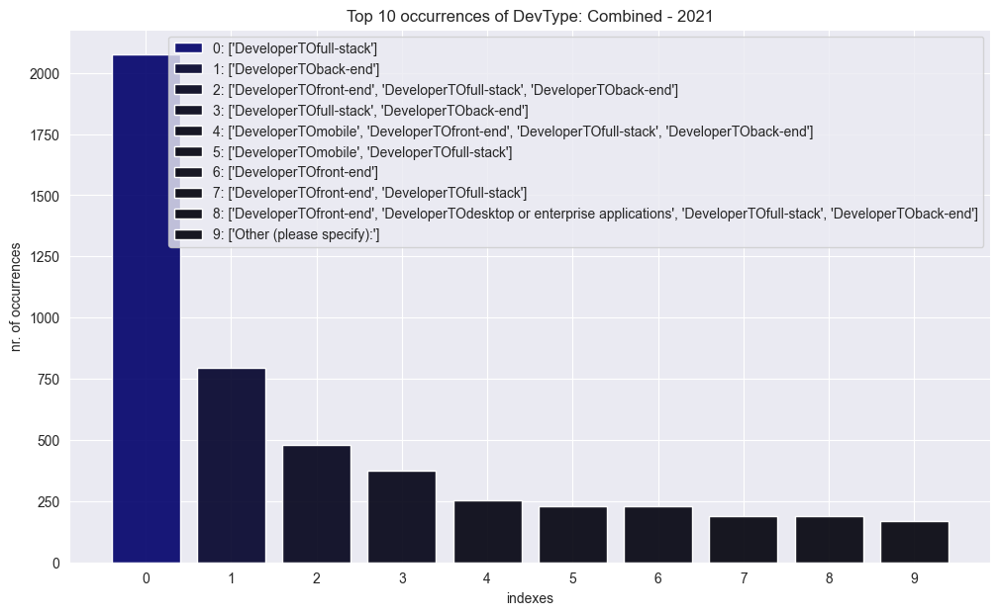

...

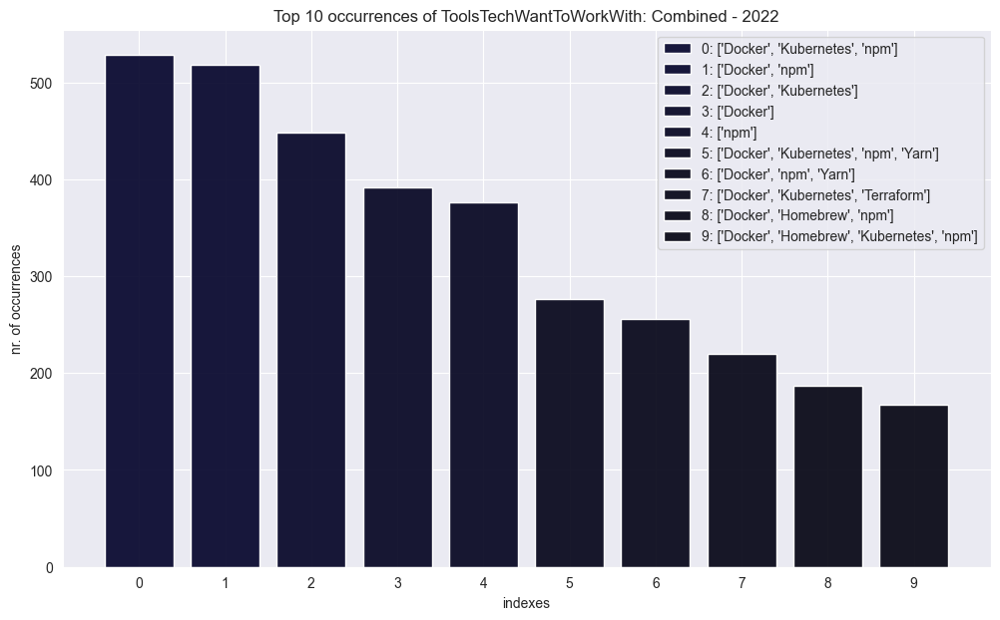

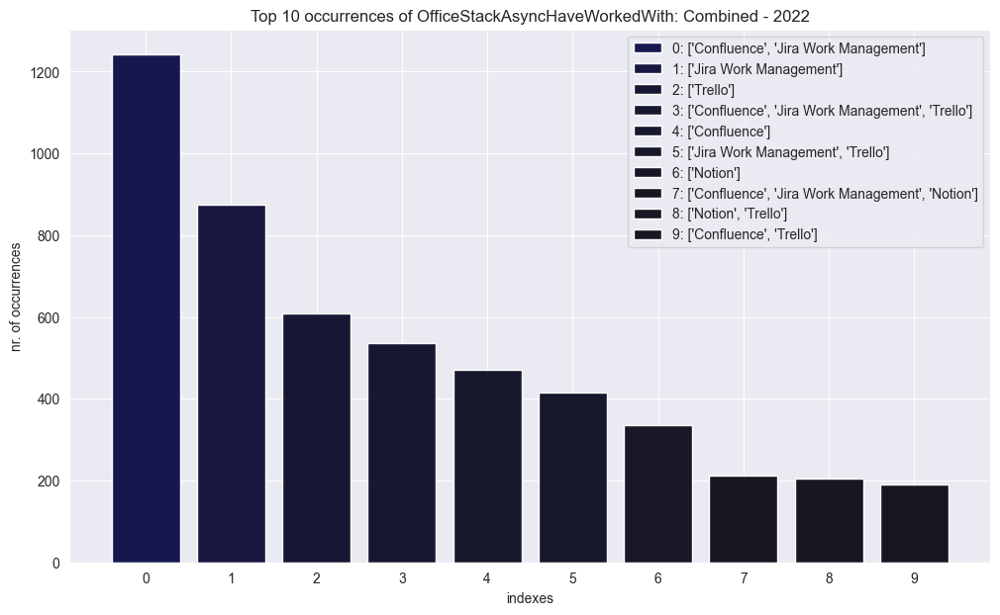

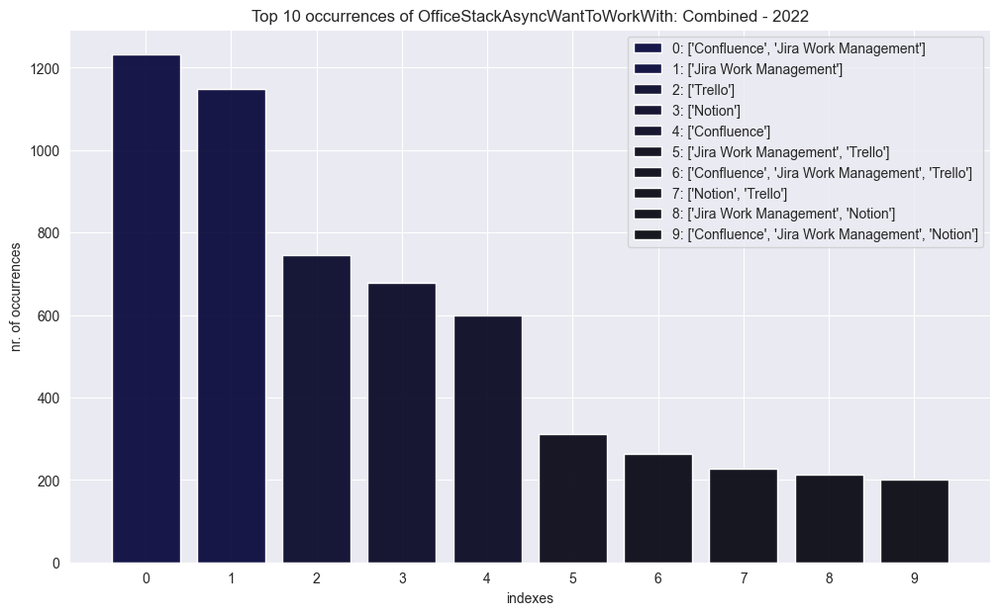

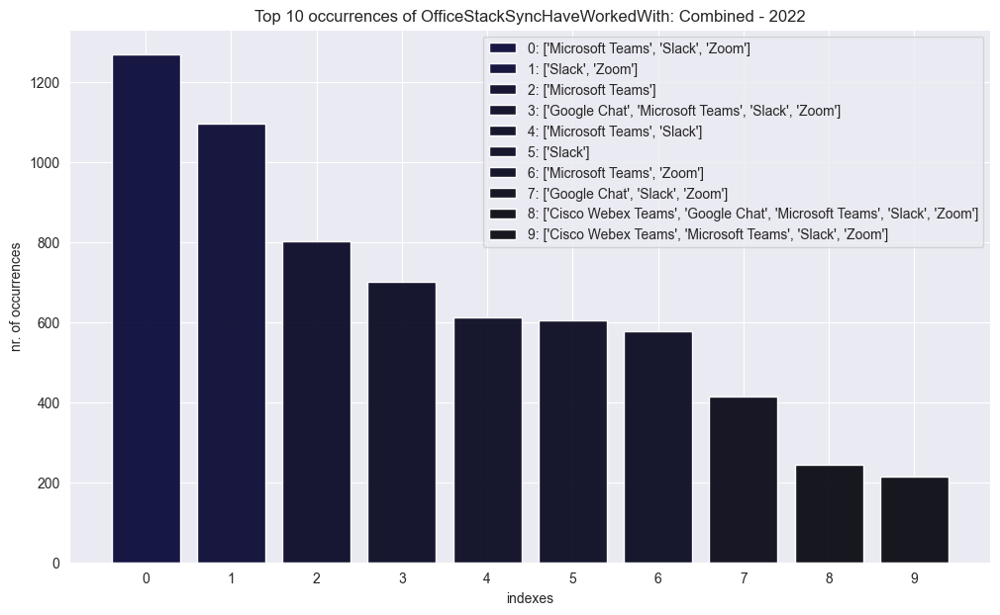

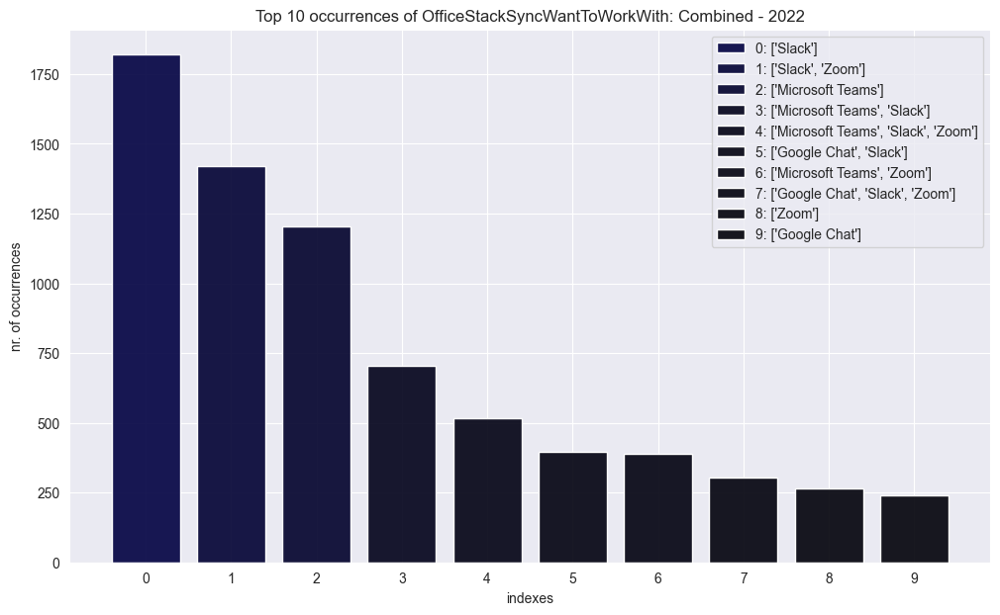

In [7]:
# combined visualization - DISPLAYING OCCURRENCES

# for each column, print years 2017-2022 (if column name exists)
for tech_column_of_22 in tech_columns_of_22:
    index = 0

    for year in years_list:# from 2017 to 2022
        if tech_column_of_22 in list(year.columns): # printing only the columns current year has
            for_plot = year[tech_column_of_22].value_counts()
            plot_bar_with_labels(10, for_plot, tech_column_of_22, "Combined - " + years_string[index])

        index += 1

C:\Users\dnaen\AppData\Local\Temp\ipykernel_21396\2875292497.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.subplots(figsize = (12,7)) # for size


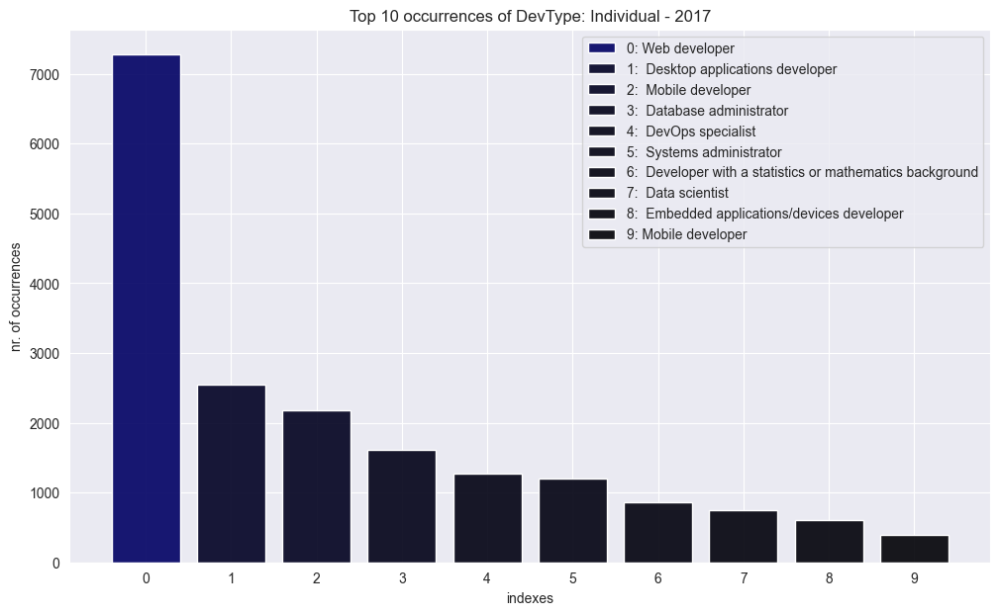

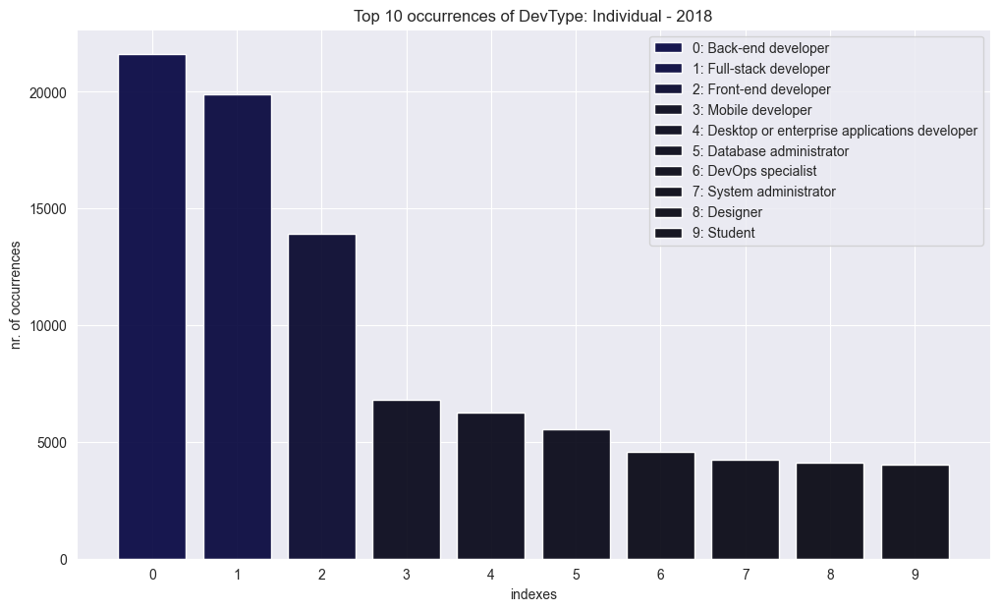

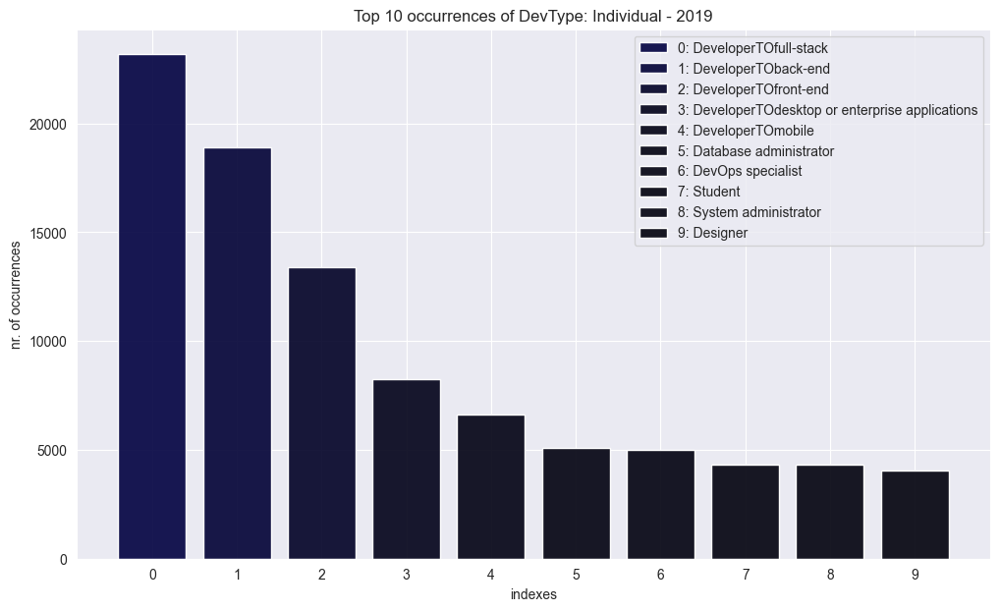

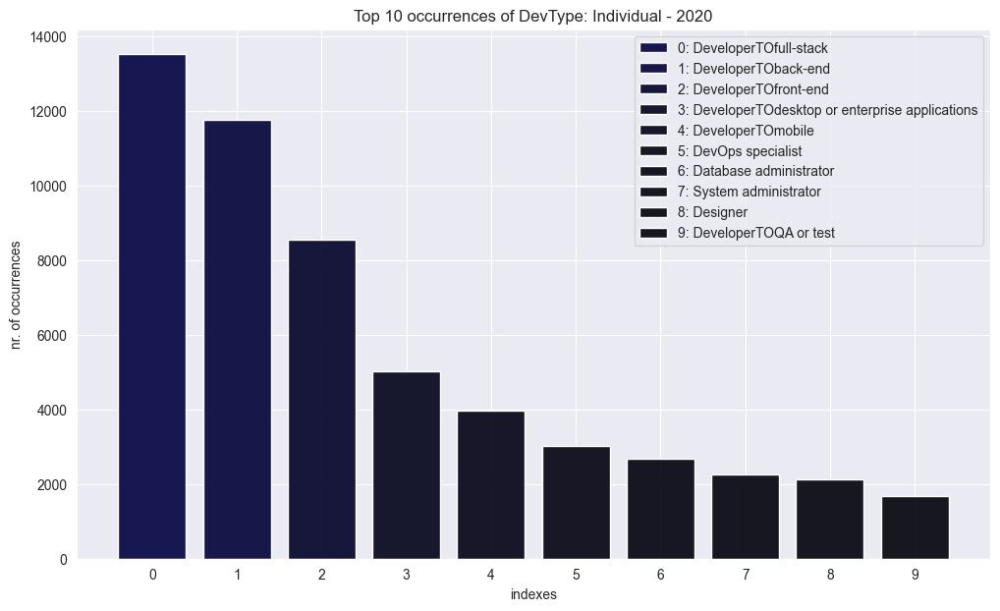

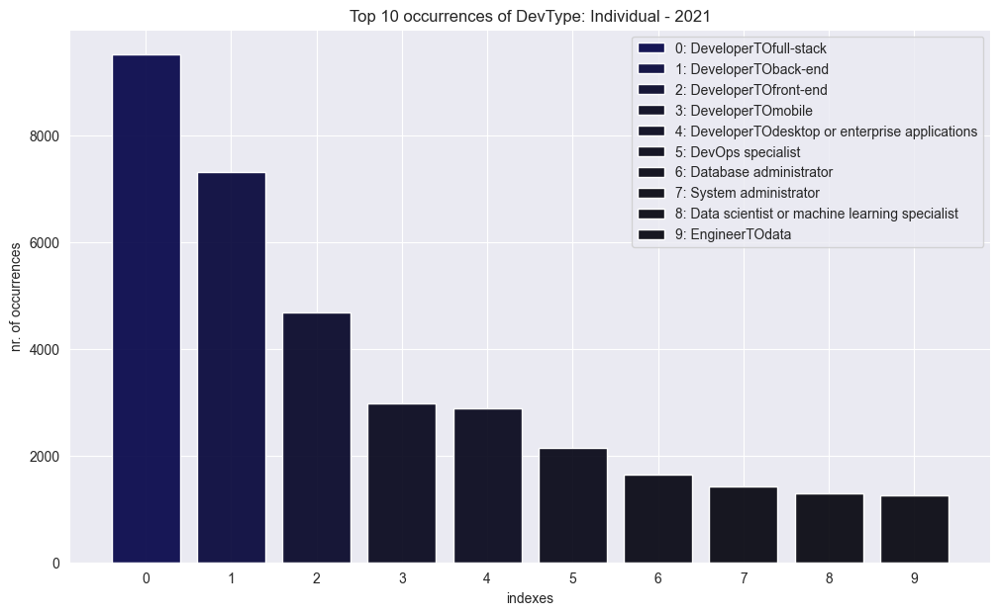

...

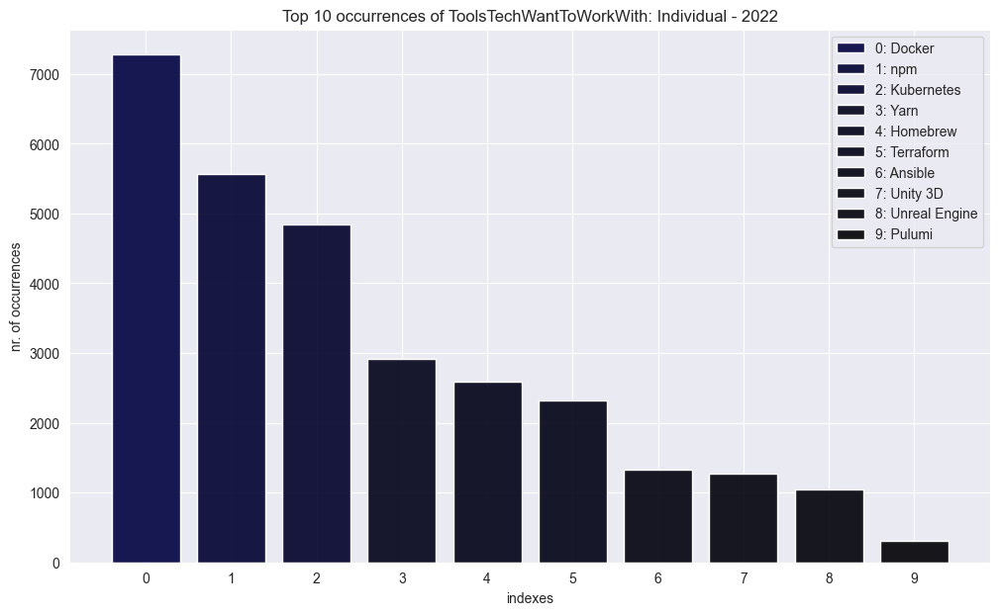

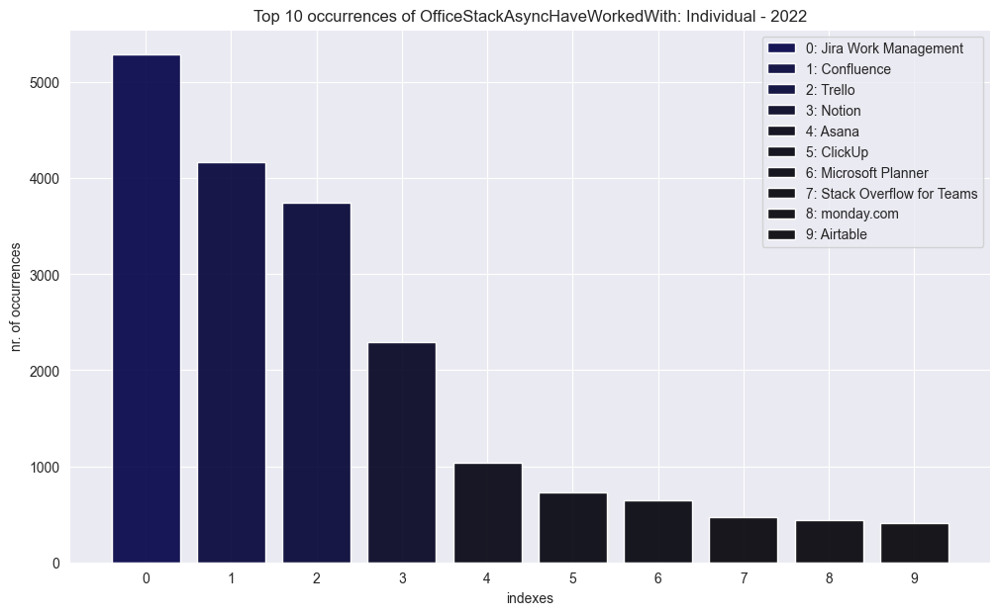

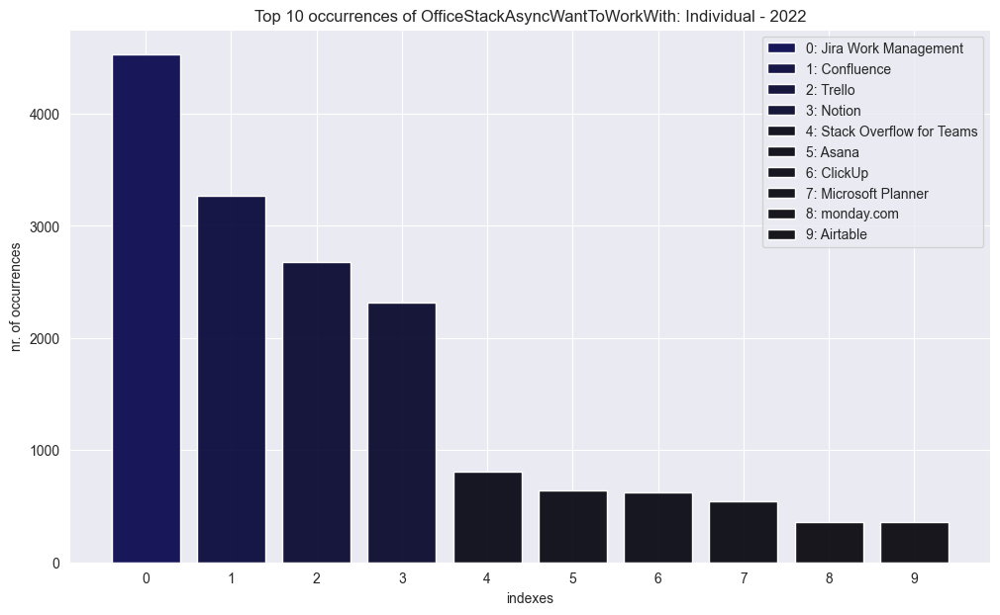

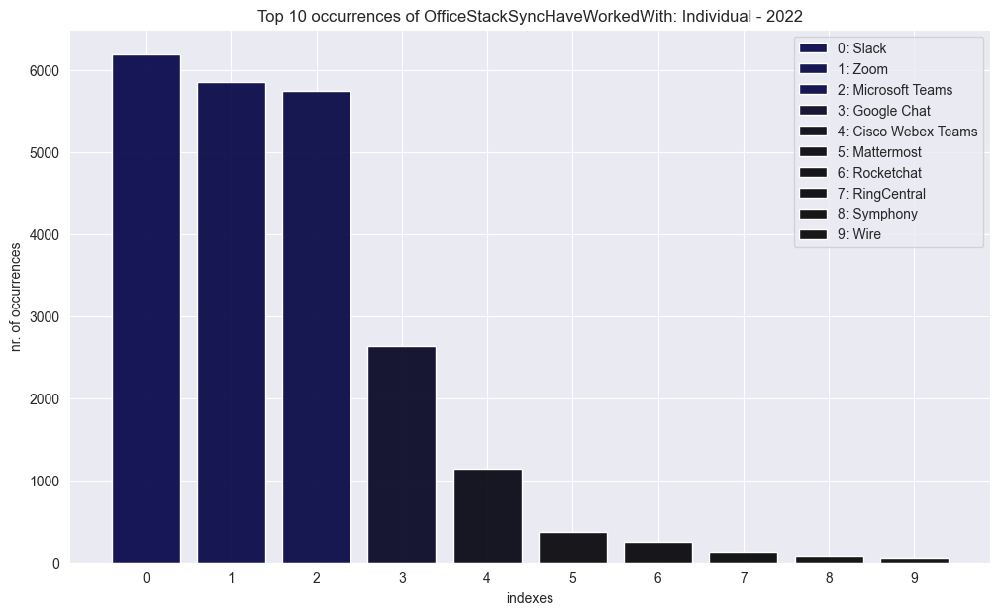

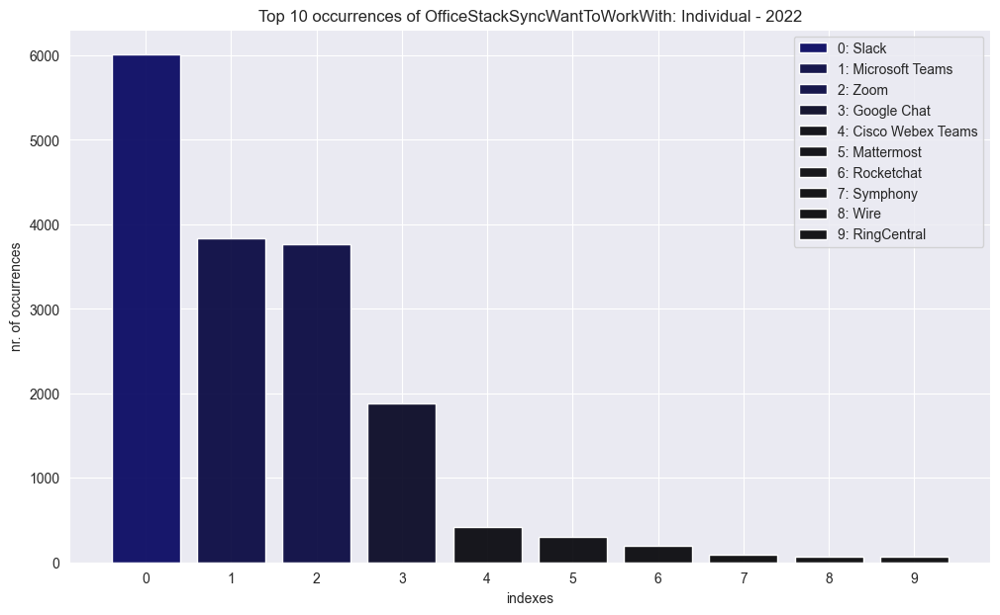

In [8]:
# individual visualization - DISPLAYING OCCURRENCES

# for each column, print years 2017-2022 (if column name exists)
for tech_column_of_22 in tech_columns_of_22:
    index = 0

    for year in years_list:# from 2017 to 2022
        if tech_column_of_22 in list(year.columns): # printing only the columns current year has
            temp_list_exploded = year[tech_column_of_22].explode()
            for_plot = temp_list_exploded.value_counts() # exploding each list response inside the column
            plot_bar_with_labels(10, for_plot, tech_column_of_22, "Individual - " + years_string[index])

        index += 1